# Image Signal Processor


### Background
An ISP is a processing block that converts raw sensor images into a colour array. There is a surprising amount of image processing that occurs between image capture and output colour images. In this assignment, you will implement a basic ISP.

You will be provided with samples of binary files containing raw sensor images (details of how to read these image files will be provided). The task is then to convert this raw data into a colour image.

The following processing will be done:
- Read in the image
- Demosaic (convert raw to RGB)
- Apply Colour Correction Matrix (matrix will be provided)
- Apply Denoise (e.g. bilateral filter)
- Apply Edge Enhancement (e.g. unsharp mask)
- Apply Contrast Enhancement (e.g. CLAHE)
- Save result to an output file




In [ ]:
# Useful libraries
%matplotlib inline
import os
import os.path as op

import numpy as np
import cv2
from skimage import exposure
from scipy import ndimage
import matplotlib.pylab as plt


## Read in the raw image file

For this assignment, a raw image file will be provided. This is an image of a photographic test target. The pixel data
is stored as unsigned integers, 8 bits per pixel. The code for reading the image will be provided.

The general process is to read in the binary information, then reshape the array into the image dimensions (in this case, 4096*2160 pixels)


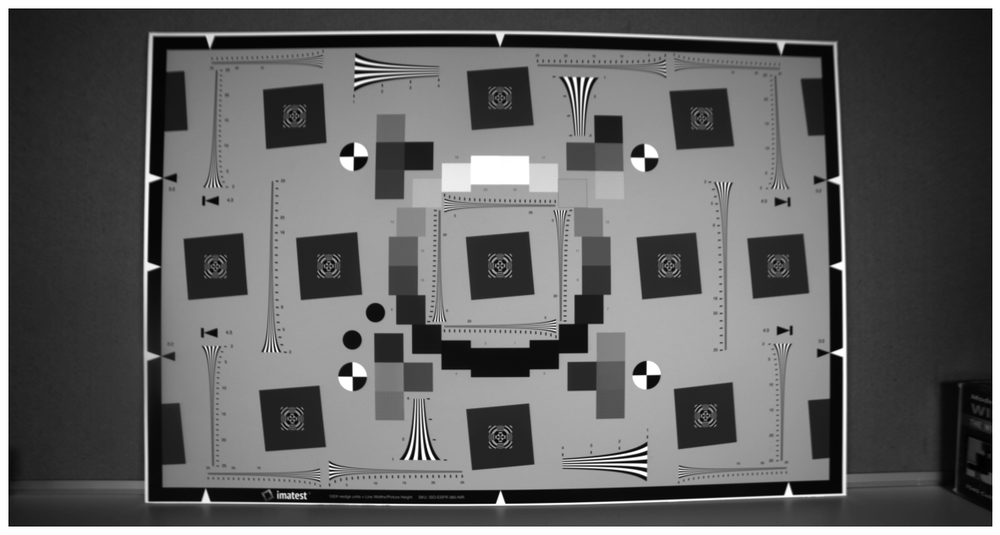

In [ ]:
# Read in the file

# Raw file details:
# width - 4096
# height - 2160
# bit depth - 8
# Bayer pattern - rggb


bayer_width = 4096
bayer_height = 2160

raw_path = 'chart.raw'

bayer = np.fromfile(raw_path, dtype='uint8', sep='')

bayer = bayer.reshape((bayer_height, bayer_width))

# plot the resulting raw file inline
plt.figure(figsize=(15,15))
plt.imshow(bayer,cmap=plt.get_cmap('gray'))
plt.axis('off')
plt.show()


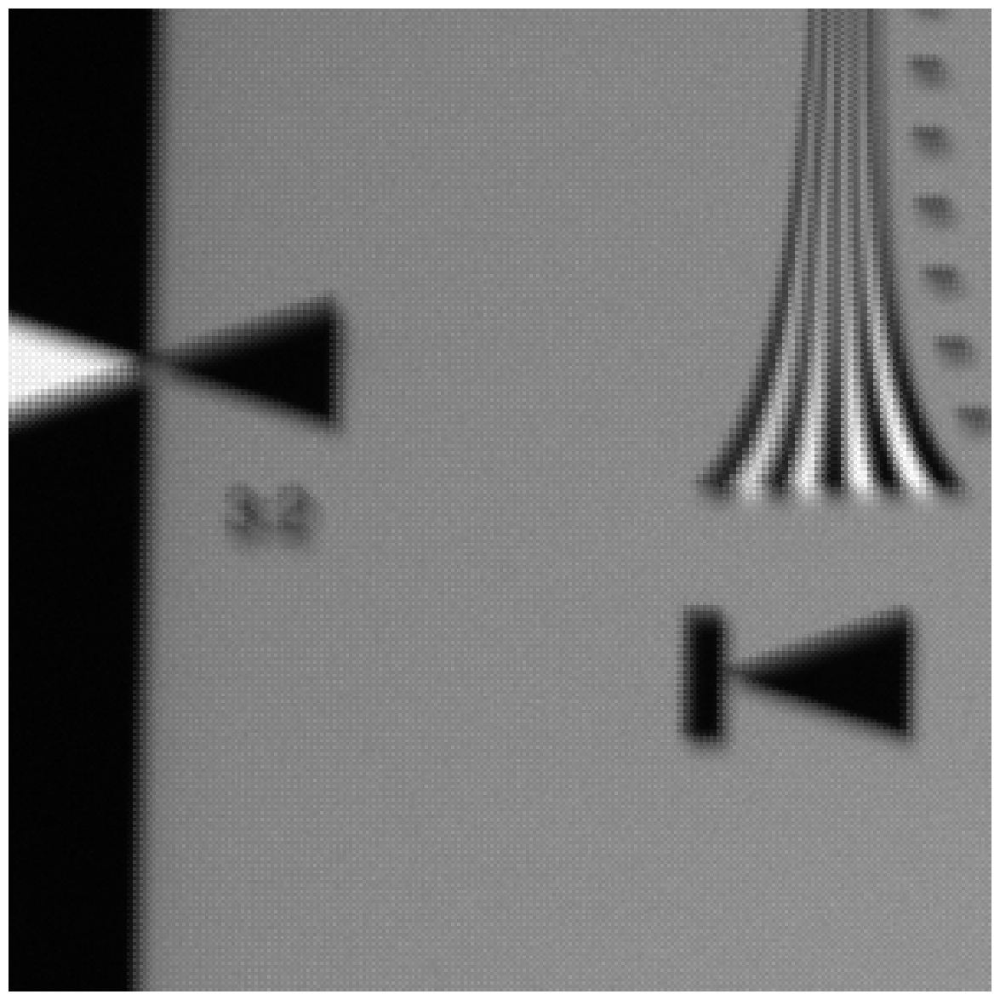

In [ ]:
# crop and show a small area, to show the Bayer raw pattern

bayer_crop = bayer[600:900, 600:900]

# plot the resulting raw file inline
plt.figure(figsize=(15,15))
plt.imshow(bayer_crop,cmap=plt.get_cmap('gray'))
plt.axis('off')
plt.show()

## Demosaic the image
The demosaic process converts raw pixel data into RGB image data. Each raw sensor pixel contains only one colour. Part of the demosaic process is to use interpolation to generate the missing colours for each pixel (i.e. a red pixel will get green and blue pixel information from the neighbouring pixels

Hint: use the opencv "cvtColor" function. This function can be used to convert between many colour spaces. For this assignment, you'll want the "COLOR_BAYER_RG2BGR" option.

more general details are available here: https://docs.opencv.org/3.4/de/d25/imgproc_color_conversions.html

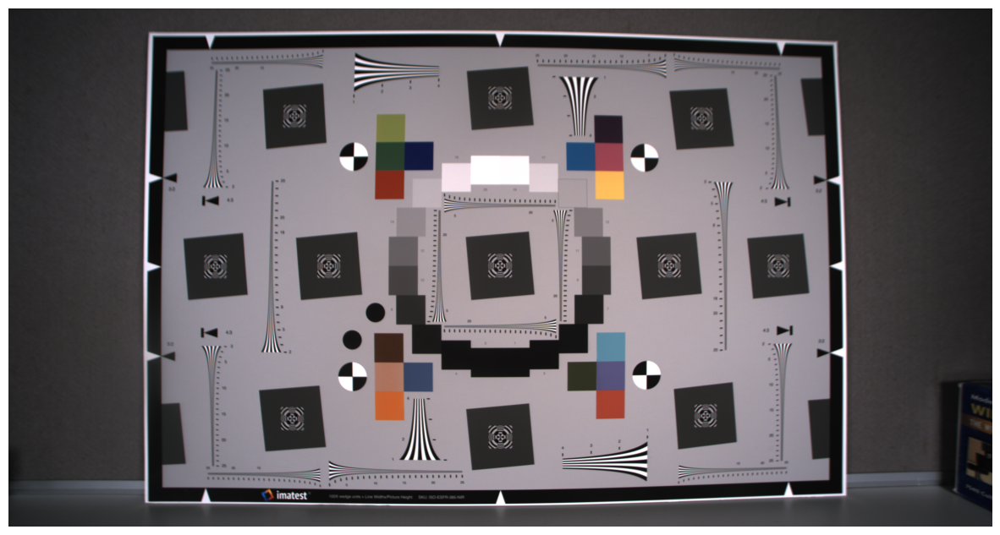

In [ ]:
# Demosaic the image (i.e. covert from raw image to RGB)
rgb_img = cv2.cvtColor(bayer, code = cv2.COLOR_BAYER_RG2BGR)

# plot the resulting raw file inline
plt.figure(figsize = (15, 15))
plt.axis('off')
plt.imshow(rgb_img)
plt.show()

## Apply colour correction

A colour correction matrix is applied to improve colour reproduction accuracy. If you notice, red appears too orange before
correction is applied.

The colour correction matrix (CCM) is calculated during the camera development phase, and varies from camera to camera.

For simplicity, the CCM for this particular camera is provided below:
    
    [[ 1382, -113, -246], [ -484, 1808, -300], [ 102, -860, 1802]]
    

 This 3*3 matrix is multiplied by the RGB values for every pixel

 ![image.png](attachment:image.png)



 Note that for embedded applications, floating point numbers are avoided wherever possible. In this example, the base is 1024 (i.e. to convert to floating point, divide the CCM by 1024)

 To apply the CCM in this example, the following steps are required:
 - cast the image to np.int32
 - multiply the RGB pixel data by the 3*3 CCM
 - divide by 1024 (note: this can be done by explicit division or right_shift by 10).
 - re-cast the image back to np.uint8
    

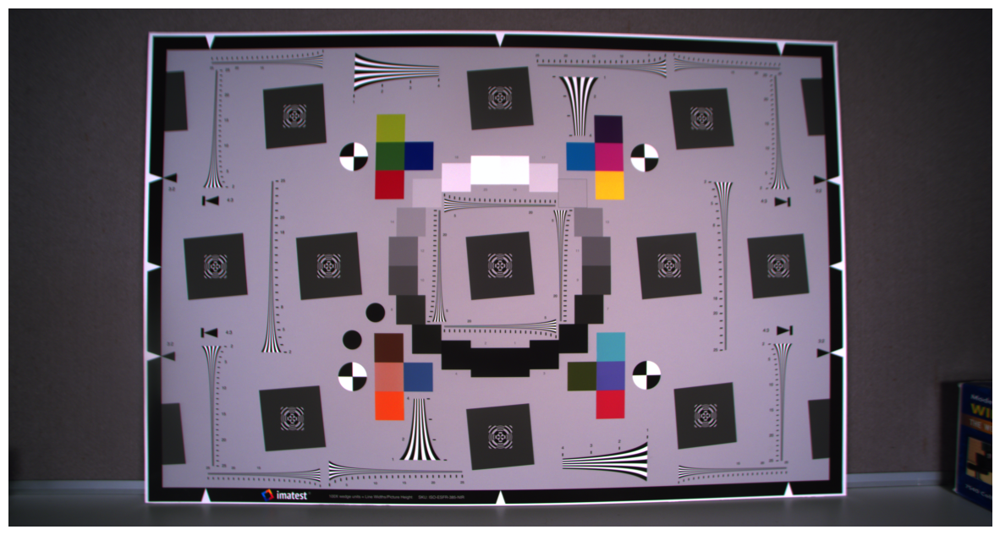

In [ ]:
# apply colour correction matrix
# note: to avoid clipping, we have to temporarily cast our image data to int32, and then return to 8 bit

# hint - cast the ccm array and image as np.int32
# multiply the image by the ccm matrix, and then use np.right_shift to scale the image down to the 8 bit range again
# use the np.clip function to ensure the data range is within 0 and 255

ccm = np.array([[ 1382, -113, -246], [ -484, 1808, -300], [ 102, -860, 1802]],dtype=np.int32).T
color_corrected_img = rgb_img.astype(np.int32)
color_corrected_img = np.dot(color_corrected_img, ccm)
color_corrected_img = np.right_shift(color_corrected_img, 10)
color_corrected_img = np.clip(color_corrected_img, 0, 255)
color_corrected_img = color_corrected_img.astype(np.uint8)


# plot the resulting raw file inline
plt.figure(figsize = (15,15))
plt.imshow(color_corrected_img)
plt.axis('off')
plt.show()

## Apply gamma correction

Gamma correction is applied using the following formula:

$$
outputImage = ((inputImage / 255)^\gamma) * 255
$$

Typically, $$\gamma=1/2.2$$


hint - use numpy clip function to ensure the data range is within 0 and 255

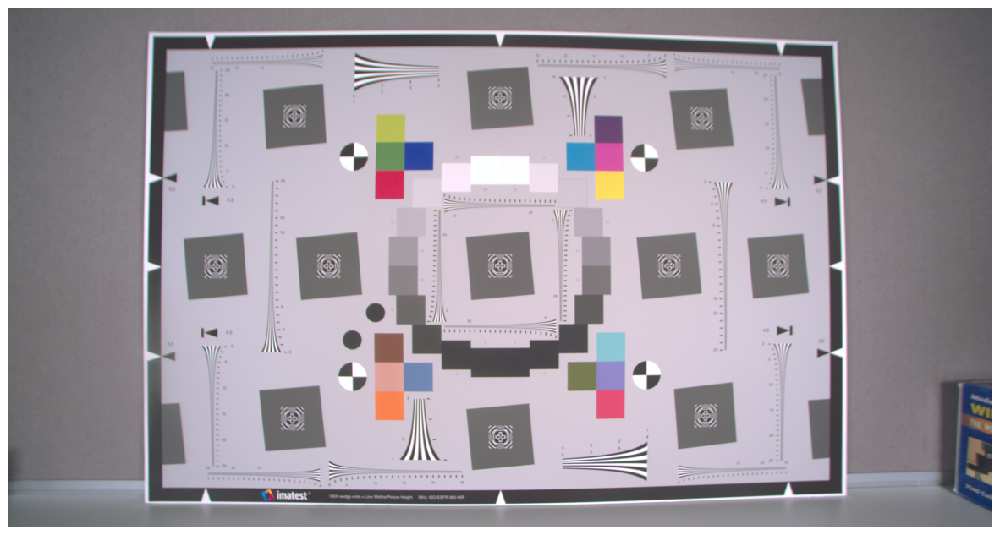

In [ ]:
# apply gamma correction
gamma = 1 / 2.2
gamma_corrected_img = ((color_corrected_img / 255)**gamma) * 255
gamma_corrected_img_clipped = np.clip(gamma_corrected_img, 0, 255).astype(np.uint8)
# plot the resulting raw file inline
plt.figure(figsize = (15,15))
plt.imshow(gamma_corrected_img_clipped)
plt.axis('off')
plt.show()

## Apply denoise to image

For this block, it is up to the student to decide which denoise block to use (there are several options available).

One good option would be openCV's bilateral filter

Hint - experiment with parameters, examine the effect of different parameters on the image. There isn't necessarily a right or wrong configuration, but changing the parameters will have an impact on the final image

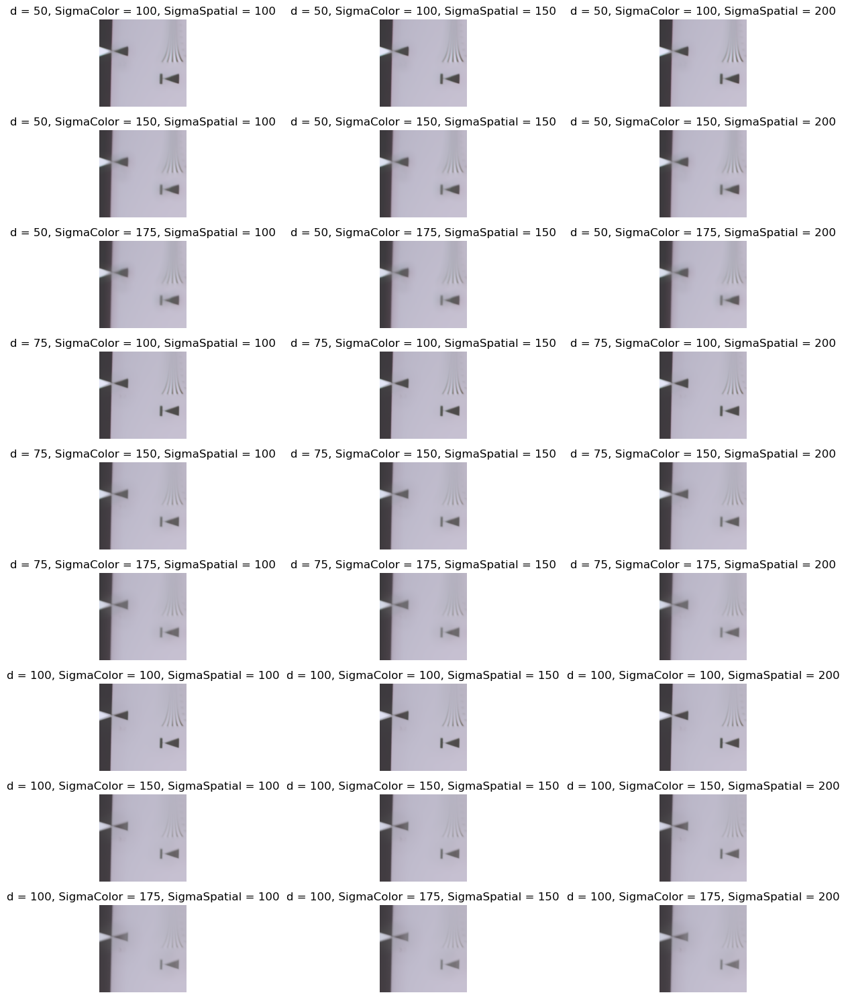

In [ ]:
# apply image denoise filtering (bilateral filter)
# hint - use opencv cv2.bilateral filter
# experiment with filter coefficients to see the impact on the image. It might help to crop on an area to get the full effect
import itertools
cropped_img = gamma_corrected_img_clipped[600:900, 600:900] #cropped portion
d_value_list = [50, 75, 100]
color_similarity = [100, 150, 175]
space = [100, 150, 200]

#Trying out different combinations of parameters for diameter, SigmaColor, SigmaSpace
different_parameters_combinations = itertools.product(d_value_list, color_similarity, space)
num_rows = 9
num_cols = 3
fig, axes = plt.subplots(9, 3, figsize = (15, 15))
for i, (d, c, s) in enumerate(different_parameters_combinations):
    denoised_img = cv2.bilateralFilter(cropped_img, d, c, s)
    row_pos = i // num_cols
    col_pos = i % num_cols
    axes[row_pos, col_pos].imshow(denoised_img)
    axes[row_pos, col_pos].axis('off')
    axes[row_pos, col_pos].set_title(f"d = {d}, SigmaColor = {c}, SigmaSpatial = {s}")
# plot the resulting raw file inline
plt.tight_layout()
plt.show()

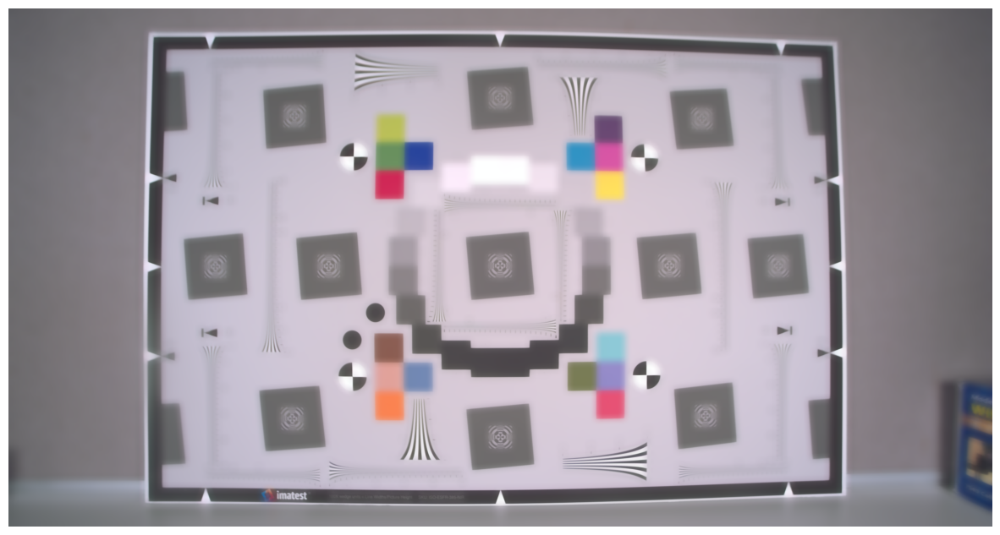

In [ ]:
#After experimenting, these values look ideal.
final_denoised_image = cv2.bilateralFilter(gamma_corrected_img_clipped, 50, 175, 200)
plt.figure(figsize = (15,15))
plt.imshow(final_denoised_image)
plt.axis('off')
plt.show()

## Apply edge enhancement

Apply edge enhancement to the image. Again, it is up to the student to select the edge enhancement approach used (we covered a few options in class)

Again, vary the parameters and see the impact on the image

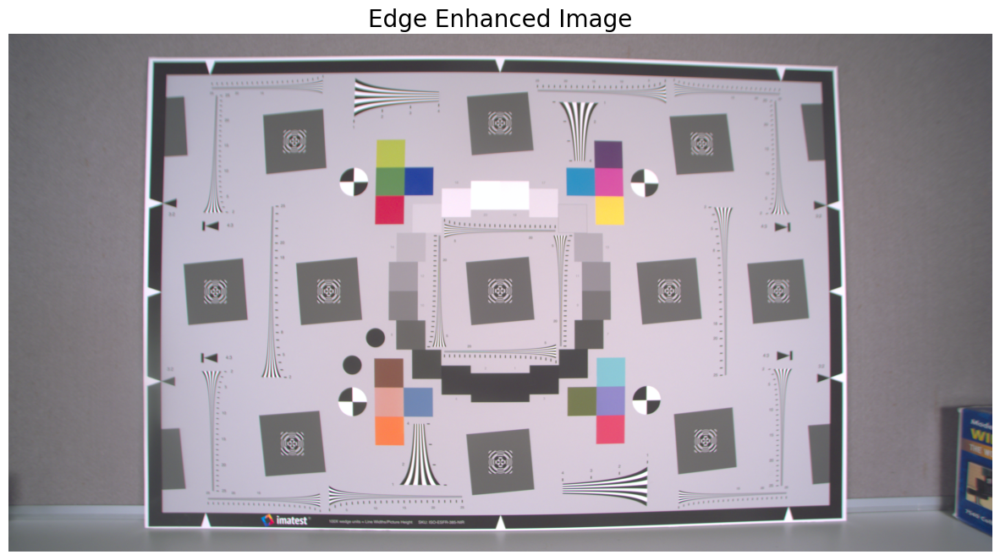

In [ ]:
# apply edge enhancement
# hint: implement Laplacian or unsharp mask filtering from previous course material.
from skimage.filters import laplace
laplace_image = np.clip(laplace(final_denoised_image)*5,0,255)
sharp_image = np.clip((laplace_image+gamma_corrected_img_clipped),0,255).astype(np.uint8)



# plot the resulting raw file inline
plt.figure(figsize=(15,15))
plt.imshow(sharp_image)
plt.title('Edge Enhanced Image',fontsize=20)
plt.axis('off')
plt.show()

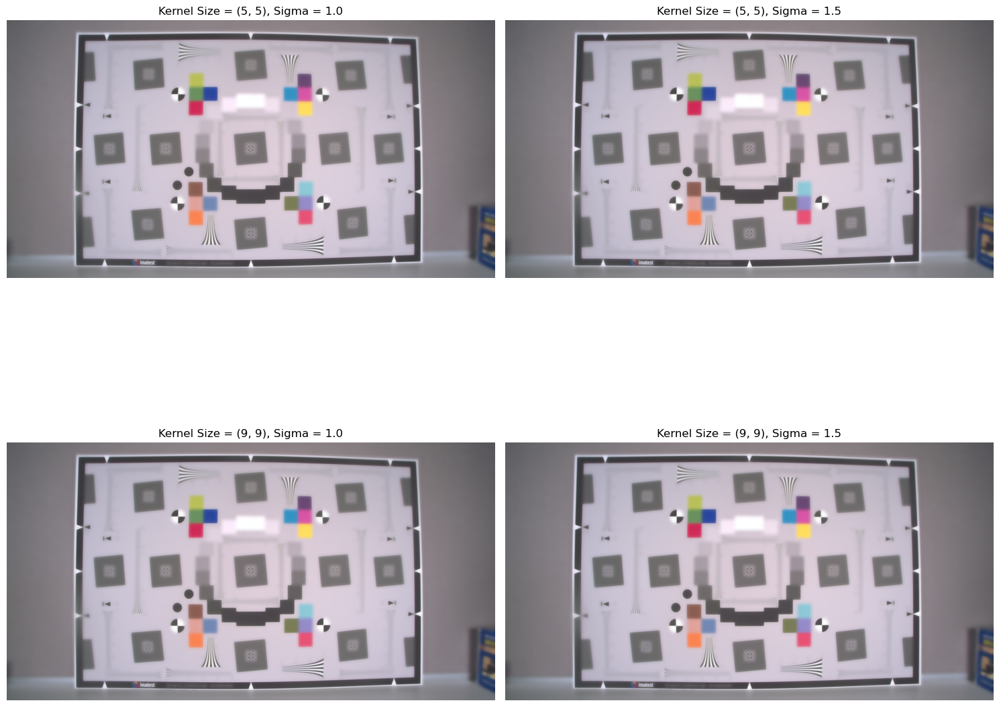

In [ ]:
# Part 1: Gaussian Blur
import cv2
import itertools
import matplotlib.pyplot as plt

def gaussian_blur(image, kernel_size, sigma):
    blurred_img = cv2.GaussianBlur(image, kernel_size, sigma)
    return blurred_img

kernel_values = [(5, 5), (9, 9)]
sigma_values = [1.0, 1.5]

different_combinations = list(itertools.product(kernel_values, sigma_values))
row_subplots = 2
number_rows = len(different_combinations) // row_subplots
if len(different_combinations) % row_subplots != 0:
    number_rows += 1

fig, axes = plt.subplots(number_rows, row_subplots, figsize=(15, 15))
for i, parameters in enumerate(different_combinations):
    kernel_size, sigma = parameters
    blurred_img = gaussian_blur(final_denoised_image, kernel_size=kernel_size, sigma=sigma)
    row_pos = i // row_subplots
    col_pos = i % row_subplots
    axes[row_pos, col_pos].imshow(blurred_img)
    axes[row_pos, col_pos].axis('off')
    axes[row_pos, col_pos].set_title(f"Kernel Size = {kernel_size}, Sigma = {sigma}")
plt.tight_layout()
plt.show()

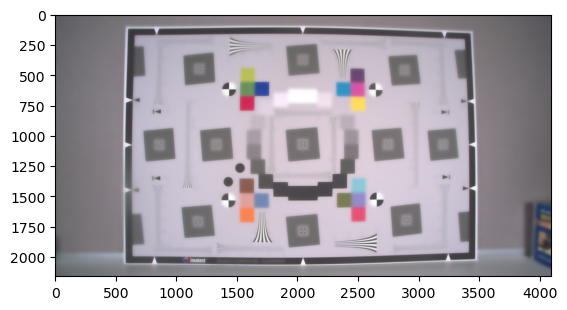

In [ ]:
final_blurred_img = gaussian_blur(final_denoised_image, kernel_size = (9,9), sigma = 1).astype(np.uint8)
plt.imshow(final_blurred_img)

In [ ]:
def add_weights(image, alpha, blurred_img):
    # Ensure both images have the same dimensions
    if image.shape != blurred_img.shape:
        raise ValueError("Image dimensions do not match")

    sharped_img = cv2.addWeighted(image, 1 + alpha, blurred_img, -alpha, 0)
    return sharped_img

alpha_values = [1.5, 2.0]

different_combinations = list(itertools.product(alpha_values))
row_subplots = 1
number_rows = len(different_combinations) // row_subplots
if len(different_combinations) % row_subplots != 0:
    number_rows += 1

fig, axes = plt.subplots(number_rows, row_subplots, figsize=(15, 15))
for i, alpha in enumerate(different_combinations):
    alpha = alpha[0]  # Extract the alpha value
    sharped_img = add_weights(final_denoised_image, alpha, final_blurred_img)  # Assuming you have 'final_blurred_img' from Part 1
    row_pos = i // row_subplots
    col_pos = i % row_subplots
    axes[row_pos, col_pos].imshow(sharped_img)
    axes[row_pos, col_pos].axis('off')
    axes[row_pos, col_pos].set_title(f"Alpha = {alpha}")

# Plot the resulting images
plt.tight_layout()
plt.show()

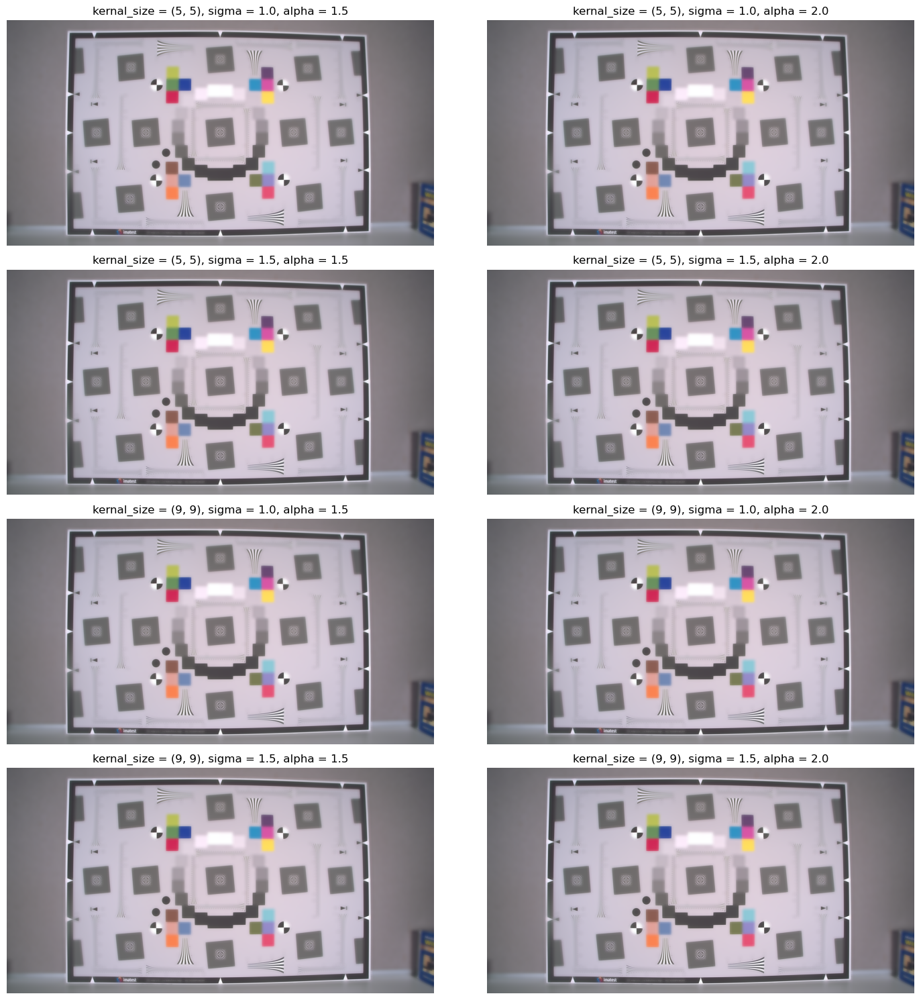

In [ ]:
# apply edge enhancement
# hint: implement Laplacian or unsharp mask filtering from previous course material.
def unsharp_mask(image, kernel_size, sigma, alpha):
    blurred_img = cv2.GaussianBlur(image, kernel_size, sigma)
    sharped_img = cv2.addWeighted(image, 1 + alpha, blurred_img, -alpha, 0)
    return sharped_img
kernel_values = [(5,5), (9,9)]
sigma_values = [1.0, 1.5]
alpha_values = [1.5, 2.0]
different_combinations = list(itertools.product(kernel_values, sigma_values, alpha_values))
row_subplots = 2
number_rows = len(different_combinations) // row_subplots
if len(different_combinations) % row_subplots != 0:
    number_rows += 1
fig, axes = plt.subplots(number_rows, row_subplots, figsize = (15,15))
for i, parameters in enumerate(different_combinations):
    kernel_size, sigma, alpha = parameters
    unsharp_enhanced_img = unsharp_mask(final_denoised_image, kernel_size = kernel_size, sigma = sigma, alpha = alpha)
    row_pos = i // row_subplots
    col_pos = i % row_subplots
    axes[row_pos, col_pos].imshow(unsharp_enhanced_img)
    axes[row_pos, col_pos].axis('off')
    axes[row_pos, col_pos].set_title(f"kernal_size = {kernel_size}, sigma = {sigma}, alpha = {alpha}")
# plot the resulting raw file inline
plt.tight_layout()
plt.show()

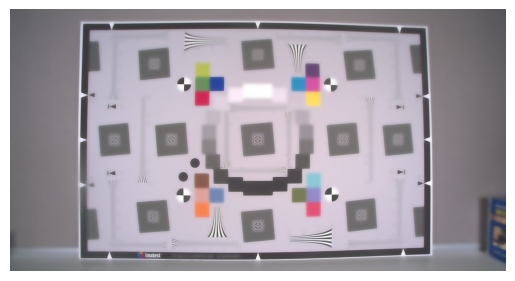

In [ ]:
final_unsharp_enhanced_img = unsharp_mask(unsharp_enhanced_img, (5, 5), 1.0, 1.5)
plt.imshow(final_unsharp_enhanced_img)
plt.axis('off')
plt.show()

## Apply contrast enhancement

Finally, apply contrast enhancement to the image. It is up to the student to select the contrast enhancement used. One option would be adaptive histogram equalization, covered earlier in the module (check out the skimage exposure library). And again, vary the parameters to examine the effect on the final image

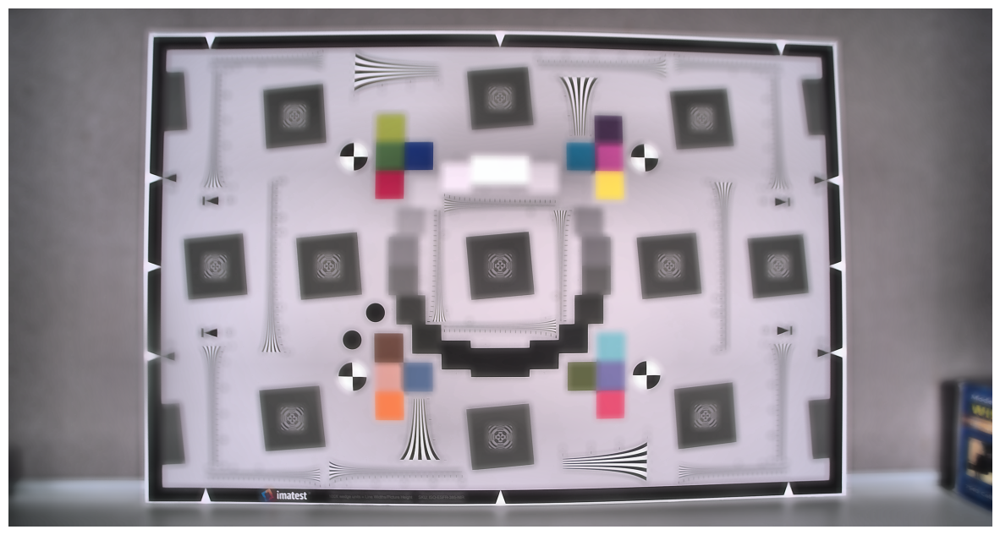

In [ ]:
# increase image contrast. Hint - check out skimage exposure
from skimage import exposure
enhanced_image_contrast = exposure.equalize_adapthist(final_unsharp_enhanced_img)
# plot the resulting raw file inline
plt.figure(figsize=(15, 15))
plt.imshow(enhanced_image_contrast)
plt.axis('off')
plt.show()

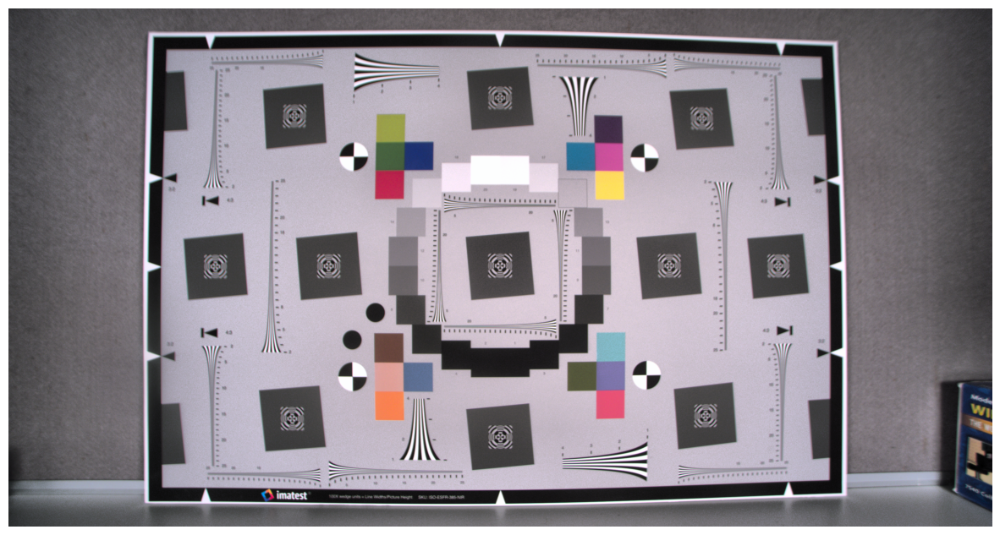

In [ ]:
# increase image contrast. Hint - check out skimage exposure
from skimage import exposure
enhanced_image_contrast = exposure.equalize_adapthist(sharp_image)
# plot the resulting raw file inline
plt.figure(figsize=(15, 15))
plt.imshow(enhanced_image_contrast)
plt.axis('off')
plt.show()